# analyse mitgcm pig model output


In [24]:
from MITgcmutils import mds
import numpy as np
import matplotlib.pyplot as plt
import cmcrameri
import cmocean as cm

In [25]:
##check dimensions of a .bin file

nx = 460    # number of gridpoints in x-direction
ny = 600    # number of gridpoints in y-direction
nz = 130
time= 1440
h = np.fromfile('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/work/run-R22-20Aug/FOBNu_200_for_cilan_rev.bin', '>f4').reshape(time,nz,nx, )
h

array([[[ 0.09182565,  0.09318683,  0.09496979, ..., -0.0075624 ,
         -0.00756249, -0.00756257],
        [ 0.08909593,  0.08331887,  0.08211352, ..., -0.00756241,
         -0.00756249, -0.00756257],
        [ 0.08875781,  0.08847432,  0.08987904, ..., -0.00756241,
         -0.0075625 , -0.00756258],
        ...,
        [ 0.01338929,  0.01338785,  0.01338425, ..., -0.00757163,
         -0.00757155, -0.00757147],
        [ 0.01338568,  0.01338424,  0.01338063, ..., -0.00757164,
         -0.00757155, -0.00757147],
        [ 0.01338424,  0.0133828 ,  0.01337918, ..., -0.00757164,
         -0.00757155, -0.00757147]],

       [[ 0.07180817,  0.08480468,  0.09567218, ..., -0.00601364,
         -0.00601371, -0.00601377],
        [ 0.08365997,  0.07760861,  0.07859131, ..., -0.00601364,
         -0.00601371, -0.00601377],
        [ 0.09864438,  0.08960532,  0.08893818, ..., -0.00601365,
         -0.00601371, -0.00601377],
        ...,
        [ 0.01475849,  0.0147574 ,  0.01475469, ..., -

In [26]:
1440/60 #so if it is hourly forcing, then yes I'd run out at 60 days. edit: configured with ob period data in data.exf

24.0

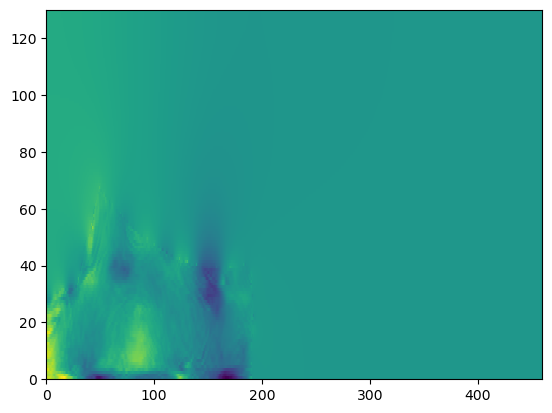

In [27]:
plt.pcolormesh(h[0,:,:])

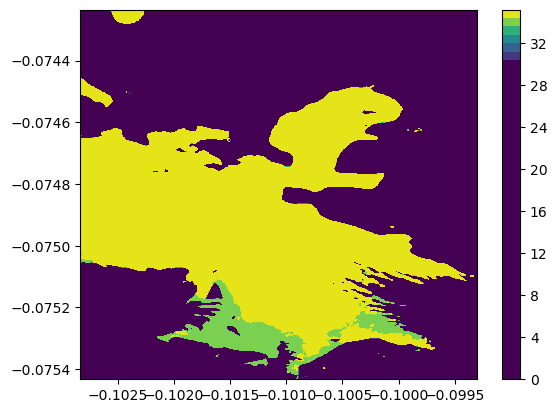

In [28]:
XC = mds.rdmds('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/work/test/XC')
YC = mds.rdmds('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/work/test/YC')
W = mds.rdmds('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/work/test/S', 4320)
plt.contourf(XC/1000, YC/1000, W[50,...], levels = 51, cmap='viridis', vmin = 30, vmax = 35)
plt.colorbar()
plt.show()

3.809027661280672
1.6713897424597461
3.825497625783972
2.918825890466056


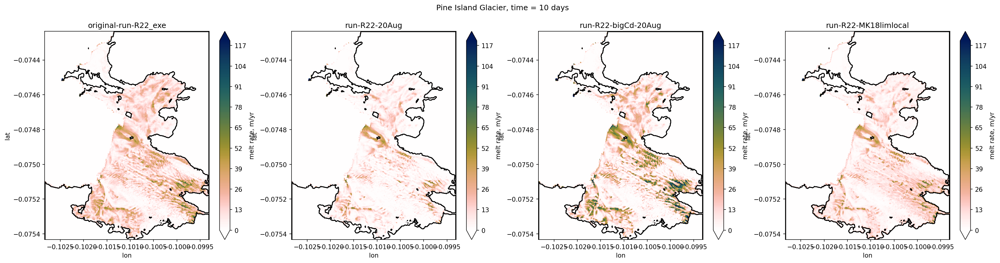

Text(0, 0.5, 'mean melt rate (m/yr)')

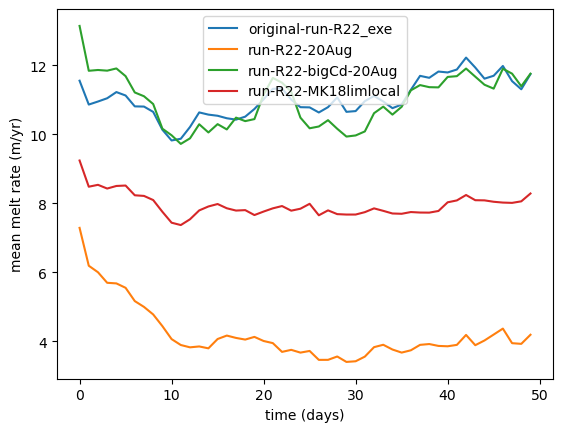

In [29]:
fig, axes  = plt.subplots(ncols = 4, figsize = (27,6),dpi = 150)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-bigCd-20Aug','run-R22-MK18limlocal']
end = '/output000/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

for i in np.arange(4):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 43200)
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[i].contourf(XC/1000, YC/1000, -s_to_yr/rho0*W, levels = np.linspace(0,120,121), cmap='cmc.batlowW_r', extend = 'both')
    plt.colorbar(cs,ax = axes[i],label = 'melt rate, m/yr', extend = 'both')
    W = mds.rdmds(dir+names[i]+end+'T', 43200)
    axes[i].contour(XC/1000, YC/1000, np.abs(np.sum(W, axis = 0)), levels = [0], colors = 'k')
    axes[i].set_ylabel('lat')
    axes[i].set_xlabel('lon')
    axes[i].set_title(names[i])
fig.suptitle('Pine Island Glacier, time = 10 days')
plt.show()

for i in np.arange(4):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    melt_arr = np.zeros(50)
    for k in np.arange(5):
        for j in np.arange(10):
            time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
            W = mds.rdmds(dir+names[i]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
            melt_arr[k*10+j]=W[W!=0].mean()
    # for j in np.arange(10):
    #     time = np.arange(4320,43201,4320)[j]
    #     W = mds.rdmds(dir+names[i]+'/output000/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
    #     melt_arr[j] = W[W!=0].mean()
    # for j in np.arange(10):
    #     time = np.arange(47520,86401,4320)[j]
    #     W = mds.rdmds(dir+names[i]+'/output001/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
    #     melt_arr[j+10] = W[W!=0].mean()
    plt.plot(np.arange(50),melt_arr,label = names[i])
plt.legend()
plt.xlabel('time (days)')
plt.ylabel('mean melt rate (m/yr)')
#plt.ylim(-0.1,17)


4.246125460218837
1.4396944852691427
4.161485833720994


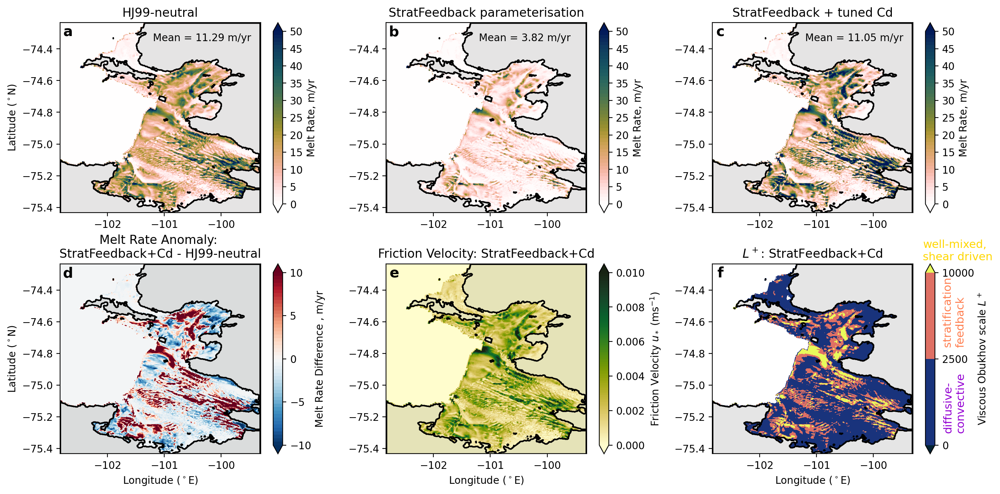

In [30]:
fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,8),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-bigCd-20Aug']
titles = ['HJ99-neutral', 'StratFeedback parameterisation', 'StratFeedback + tuned Cd']
end = '/output001/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

#take time averages of melt
WHJ99 = np.zeros_like(mds.rdmds(dir+names[0]+end+'SHICE_fwFlux', 86400))
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[0]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WHJ99 = WHJ99 + W
WHJ99 =WHJ99/30

WR22cd = np.zeros_like(mds.rdmds(dir+names[2]+end+'SHICE_fwFlux', 86400))
SSR22cd = mds.rdmds(dir+names[2]+end+'shelfsnap', 86400)
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[2]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WR22cd = WR22cd + W
        SS = mds.rdmds(dir+names[2]+'/output00'+str(k)+'/'+'shelfsnap', time)
        SSR22cd = SSR22cd + SS
WR22cd =WR22cd/30
SSR22cd = SSR22cd/30

WR22 = np.zeros_like(mds.rdmds(dir+names[1]+end+'SHICE_fwFlux', 86400))
SSR22 = mds.rdmds(dir+names[1]+end+'shelfsnap', 86400)
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[1]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WR22 = WR22 + W
WR22 =WR22/30


for i in np.arange(3):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    #W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 86400)
    if i ==0:
        W = WHJ99
    elif i ==1:
        W = WR22
    elif i ==2:
        W = WR22cd
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[0,i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,50,51), cmap='cmc.batlowW_r',extend = 'both')
    plt.colorbar(cs,ax = axes[0,i],label = 'Melt Rate, m/yr', extend = 'both',ticks = np.arange(0,51,5))
    Ts = mds.rdmds(dir+names[i]+end+'T', 86400)
    axes[0,i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[0,i].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
    
    axes[0,i].set_ylabel('Latitude ($^\circ$N)')
    #axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[0,i].set_title(titles[i])
    axes[0,i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

    if i==2: #tuned R22
        # plot difference
        cs = axes[1,0].contourf(XC, YC, -s_to_yr/rho0*(WR22cd-WHJ99), levels = np.linspace(-10,10,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[1,0],label = 'Melt Rate Difference , m/yr', extend = 'both',ticks = np.arange(-10,11,5))
        axes[1,0].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,0].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,0].set_ylabel('Latitude ($^\circ$N)')
        axes[1,0].set_xlabel('Longitude ($^\circ$E)')
        axes[1,0].set_title('Melt Rate Anomaly: \nStratFeedback+Cd - HJ99-neutral')
        #axes[1,0].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

        #W = mds.rdmds(dir+names[i]+end+'shelfsnap', 86400)
        #shelfsnap SSR22 has ustar, gammaT, gammaS, Lplus
        cs = axes[1,1].contourf(XC, YC, SSR22cd[0,...], levels = np.linspace(0,1e-2,101), cmap=cm.cm.speed,extend = 'both')
        plt.colorbar(cs,ax = axes[1,1],label = 'Friction Velocity $u_*$ (ms$^{-1}$)', extend = 'both',ticks = np.arange(0,0.0101,0.002))
        axes[1,1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,1].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,1].set_ylabel('Latitude ($^\circ$N)')
        axes[1,1].set_xlabel('Longitude ($^\circ$E)')
        axes[1,1].set_title('Friction Velocity: StratFeedback+Cd')
        cs = axes[1,2].contourf(XC, YC, SSR22cd[3,...], levels = [0,2500,1e4], cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[1,2],label = 'Viscous Obukhov scale $L^+$', extend = 'both')
        axes[1,2].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,2].contourf(XC, YC, np.where(np.sum(Ts, axis = 0)==0,np.sum(Ts, axis = 0),np.nan), levels = [0,0.1], colors = ['k'],alpha = 0.1)
        axes[1,2].set_ylabel('Latitude ($^\circ$N)')
        axes[1,2].set_xlabel('Longitude ($^\circ$E)')
        axes[1,2].set_title('$L^+$: StratFeedback+Cd')
        
        plt.text(1.15,0.12, 'diffusive-\nconvective',rotation = 90,
        transform=axes[1,2].transAxes,color = 'darkviolet',fontsize = 11)
        plt.text(1.15,0.57, 'stratification \nfeedback',rotation = 90,
        transform=axes[1,2].transAxes,color = 'coral',fontsize = 11)
        plt.text(1.05,1.02, 'well-mixed,\nshear driven',#rotation = 90
        transform=axes[1,2].transAxes,color = 'gold',fontsize = 11)

        

        
        
#fig.suptitle('MITgcm Pine Island Glacier, time = 20 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')

axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

fig.subplots_adjust(wspace = 0.3,hspace = 0.27)
plt.show()


4.1444967638274495
1.4396944852691427
4.161485833720994


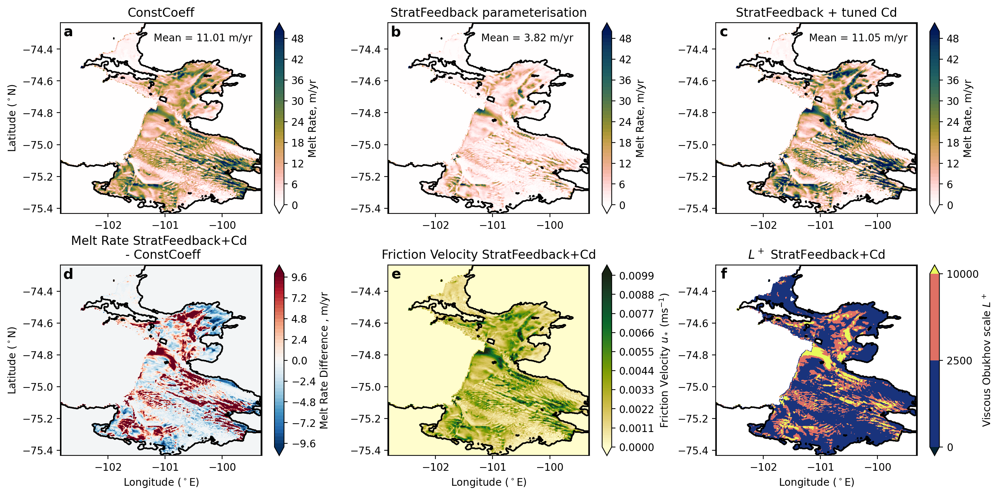

In [31]:
# Plot constcoeff instead of HJ99-neutral

fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,8),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['run-R22lim-20Aug','run-R22-20Aug','run-R22-bigCd-20Aug']
titles = ['ConstCoeff', 'StratFeedback parameterisation', 'StratFeedback + tuned Cd']
end = '/output001/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

#take time averages of melt
WHJ99 = np.zeros_like(mds.rdmds(dir+names[0]+end+'SHICE_fwFlux', 86400))
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[0]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WHJ99 = WHJ99 + W
WHJ99 =WHJ99/30

WR22cd = np.zeros_like(mds.rdmds(dir+names[2]+end+'SHICE_fwFlux', 86400))
SSR22cd = mds.rdmds(dir+names[2]+end+'shelfsnap', 86400)
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[2]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WR22cd = WR22cd + W
        SS = mds.rdmds(dir+names[2]+'/output00'+str(k)+'/'+'shelfsnap', time)
        SSR22cd = SSR22cd + SS
WR22cd =WR22cd/30
SSR22cd = SSR22cd/30

WR22 = np.zeros_like(mds.rdmds(dir+names[1]+end+'SHICE_fwFlux', 86400))
SSR22 = mds.rdmds(dir+names[1]+end+'shelfsnap', 86400)
for k in np.arange(2,5):
    for j in np.arange(10):
        time = np.arange(4320*(10*k+1),43201*(20*(k+1)),4320)[j]
        W = mds.rdmds(dir+names[1]+'/output00'+str(k)+'/'+'SHICE_fwFlux', time)#*(-s_to_yr)/rho0
        WR22 = WR22 + W
WR22 =WR22/30


for i in np.arange(3):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    #W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 86400)
    if i ==0:
        W = WHJ99
    elif i ==1:
        W = WR22
    elif i ==2:
        W = WR22cd
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[0,i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,50,51), cmap='cmc.batlowW_r',extend = 'both')
    plt.colorbar(cs,ax = axes[0,i],label = 'Melt Rate, m/yr', extend = 'both')
    Ts = mds.rdmds(dir+names[i]+end+'T', 86400)
    axes[0,i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[0,i].set_ylabel('Latitude ($^\circ$N)')
    #axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[0,i].set_title(titles[i])
    axes[0,i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

    if i==2: #tuned R22
        # plot difference
        cs = axes[1,0].contourf(XC, YC, -s_to_yr/rho0*(WR22cd-WHJ99), levels = np.linspace(-10,10,51), cmap='RdBu_r',extend = 'both')
        plt.colorbar(cs,ax = axes[1,0],label = 'Melt Rate Difference , m/yr', extend = 'both')
        axes[1,0].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,0].set_ylabel('Latitude ($^\circ$N)')
        axes[1,0].set_xlabel('Longitude ($^\circ$E)')
        axes[1,0].set_title('Melt Rate StratFeedback+Cd \n - ConstCoeff')
        #axes[1,0].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

        #W = mds.rdmds(dir+names[i]+end+'shelfsnap', 86400)
        #shelfsnap SSR22 has ustar, gammaT, gammaS, Lplus
        cs = axes[1,1].contourf(XC, YC, SSR22cd[0,...], levels = np.linspace(0,1e-2,101), cmap=cm.cm.speed,extend = 'both')
        plt.colorbar(cs,ax = axes[1,1],label = 'Friction Velocity $u_*$ (ms$^{-1}$)', extend = 'both')
        axes[1,1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,1].set_ylabel('Latitude ($^\circ$N)')
        axes[1,1].set_xlabel('Longitude ($^\circ$E)')
        axes[1,1].set_title('Friction Velocity StratFeedback+Cd')
        
        cs = axes[1,2].contourf(XC, YC, SSR22cd[3,...], levels = [0,2500,1e4], cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[1,2],label = 'Viscous Obukhov scale $L^+$', extend = 'both')
        axes[1,2].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
        axes[1,2].set_ylabel('Latitude ($^\circ$N)')
        axes[1,2].set_xlabel('Longitude ($^\circ$E)')
        axes[1,2].set_title('$L^+$ StratFeedback+Cd')
        
        

        
        
#fig.suptitle('MITgcm Pine Island Glacier, time = 20 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')

axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

fig.subplots_adjust(wspace = 0.3,hspace = 0.27)
plt.show()


3.812144281254024
3.812144281254024
1.6713897424597461
3.825497625783972
3.7978733107111577
3.8318805705658106


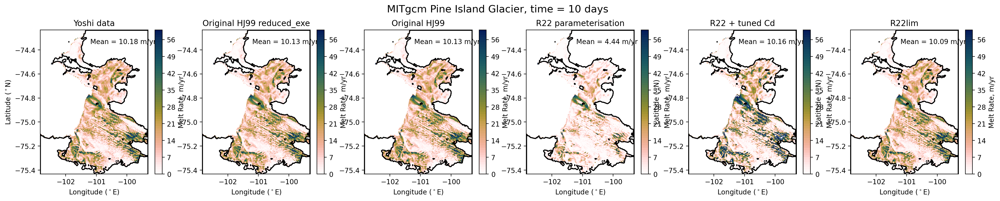

In [32]:
fig, axes  = plt.subplots(ncols = 6, figsize = (25,4),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
names = ['original-run-reduced_exe','original-run','run-R22-20Aug','run-R22-bigCd-20Aug','run-R22lim-20Aug']
titles = ['Original HJ99 reduced_exe','Original HJ99', 'R22 parameterisation', 'R22 + tuned Cd', 'R22lim']
end = '/output000/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000

for i in np.arange(1):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 43200)
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[i+1].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,60,61), cmap='cmc.batlowW_r')
    plt.colorbar(cs,ax = axes[i+1],label = 'Melt Rate, m/yr', extend = 'both')
    Ts = mds.rdmds(dir+names[i]+end+'T', 43200)
    axes[i+1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[i+1].set_ylabel('Latitude ($^\circ$N)')
    axes[i+1].set_xlabel('Longitude ($^\circ$E)')
    axes[i+1].set_title(titles[i])
    axes[i+1].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

for i in np.arange(1,5):
    #XC = mds.rdmds(dir+names[i]+end+'XC')
    #YC = mds.rdmds(dir+names[i]+end+'YC')
    W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 43200)
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[i+1].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,60,61), cmap='cmc.batlowW_r')
    plt.colorbar(cs,ax = axes[i+1],label = 'Melt Rate, m/yr', extend = 'both')
    #Ts = mds.rdmds(dir+names[i]+end+'T', 43200)
    axes[i+1].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[i+1].set_ylabel('Latitude ($^\circ$N)')
    axes[i+1].set_xlabel('Longitude ($^\circ$E)')
    axes[i+1].set_title(titles[i])
    axes[i+1].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)


dir = '/g/data/x77/cy8964/PIG/ECCO2/High_res_PIG/PIG_only_200m/latlon_run23/'
titles = ['Yoshi data']
for i in np.arange(1):
    XC = mds.rdmds(dir+'XC')
    YC = mds.rdmds(dir+'YC')
    W = mds.rdmds(dir+'SHICE_fwFlux', 43200)
    print(W.mean()*(-s_to_yr)/rho0)
    cs = axes[i].contourf(XC, YC, -s_to_yr/rho0*W, levels = np.linspace(0,60,61), cmap='cmc.batlowW_r')
    plt.colorbar(cs,ax = axes[i],label = 'Melt Rate, m/yr', extend = 'both')
    Ts = mds.rdmds(dir+'T', 43200)
    axes[i].contour(XC, YC, np.abs(np.sum(Ts, axis = 0)), levels = [0], colors = 'k')
    axes[i].set_ylabel('Latitude ($^\circ$N)')
    axes[i].set_xlabel('Longitude ($^\circ$E)')
    axes[i].set_title(titles[i])
    axes[i].text( -101.2,-74.35,'Mean = '+"{:.2f}".format(W[W!=0].mean()*(-s_to_yr)/rho0)+' m/yr',)

fig.suptitle('MITgcm Pine Island Glacier, time = 10 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[1].set_ylabel('')
axes[2].set_ylabel('')
axes[3].set_ylabel('')

plt.show()


Text(0, 0.5, 'mean melt rate (m/yr)')

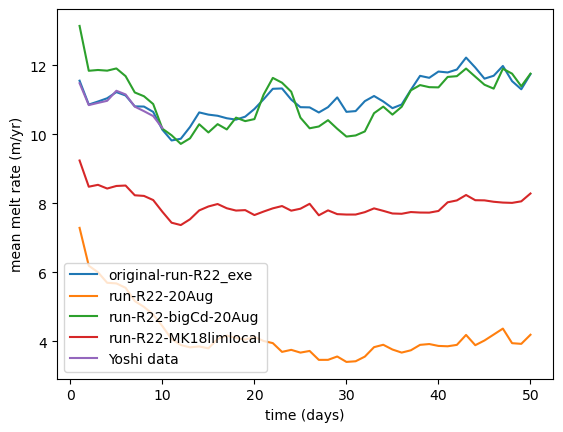

In [33]:
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
titles = ['Original HJ99', 'R22 parameterisation', 'R22 + tuned Cd','R22 + MK18']
end = '/output001/'
#names = ['original-run','run-R22lim','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-bigCd-20Aug','run-R22-MK18limlocal']

for i in np.arange(4):
    # XC = mds.rdmds(dir+names[i]+end+'XC')
    # YC = mds.rdmds(dir+names[i]+end+'YC')
    melt_arr = np.zeros(50)
    for j in np.arange(10):
        time = np.arange(4320,43201,4320)[j]
        W = mds.rdmds(dir+names[i]+'/output000/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = W[W!=0].mean()
    for j in np.arange(10,20):
        time = np.arange(4320*11,4320*20+1,4320)[j-10]
        W = mds.rdmds(dir+names[i]+'/output001/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = W[W!=0].mean()
    for j in np.arange(20,30):
        time = np.arange(4320*21,4320*30+1,4320)[j-20]
        W = mds.rdmds(dir+names[i]+'/output002/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = W[W!=0].mean()
    for j in np.arange(30,40):
        time = np.arange(4320*31,4320*40+1,4320)[j-30]
        W = mds.rdmds(dir+names[i]+'/output003/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = W[W!=0].mean()
    for j in np.arange(40,50):
        time = np.arange(4320*41,43201*50+1,4320)[j-40]
        W = mds.rdmds(dir+names[i]+'/output004/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
        melt_arr[j] = W[W!=0].mean()
    # for j in np.arange(10):
    #     time = np.arange(47520,86401,4320)[j]
    #     W = mds.rdmds(dir+names[i]+'/output001/'+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
    #     melt_arr[j+10] = W[W!=0].mean()
    plt.plot(np.arange(4320,4320*50+1,4320)/4320,melt_arr,label = names[i])

dir = '/g/data/x77/cy8964/PIG/ECCO2/High_res_PIG/PIG_only_200m/latlon_run23/'
melt_arr = np.zeros(10)
for j in np.arange(10):
    time = np.arange(4320,43201,4320)[j]
    W = mds.rdmds(dir+'SHICE_fwFlux', time)*(-s_to_yr)/rho0
    melt_arr[j] = W[W!=0].mean()
plt.plot(np.arange(4320,43201,4320)/4320,melt_arr,label = 'Yoshi data')

plt.legend()
plt.xlabel('time (days)')
plt.ylabel('mean melt rate (m/yr)')



In [34]:
def mean50days(variable): 
    time = 4320
    W = mds.rdmds(dir+names[i]+'/output000/'+variable, time)*0
    for j in np.arange(10):
        time = np.arange(4320,43201,4320)[j]
        W = W+mds.rdmds(dir+names[i]+'/output000/'+variable, time)
    for j in np.arange(10,20):
        time = np.arange(4320*11,4320*20+1,4320)[j-10]
        W = W+mds.rdmds(dir+names[i]+'/output001/'+variable, time)
    for j in np.arange(20,30):
        time = np.arange(4320*21,4320*30+1,4320)[j-20]
        W =W+ mds.rdmds(dir+names[i]+'/output002/'+variable, time)
    for j in np.arange(30,40):
        time = np.arange(4320*31,4320*40+1,4320)[j-30]
        W =W+ mds.rdmds(dir+names[i]+'/output003/'+variable, time)
    for j in np.arange(40,50):
        time = np.arange(4320*41,43201*50+1,4320)[j-40]
        W = W+mds.rdmds(dir+names[i]+'/output004/'+variable, time)
    return W/50

In [35]:
def mean2050days(variable): #make it mean20-50days instead!
    time = 4320
    W = mds.rdmds(dir+names[i]+'/output000/'+variable, time)*0
    # for j in np.arange(10):
    #     time = np.arange(4320,43201,4320)[j]
    #     W = W+mds.rdmds(dir+names[i]+'/output000/'+variable, time)
    # for j in np.arange(10,20):
    #     time = np.arange(4320*11,4320*20+1,4320)[j-10]
    #     W = W+mds.rdmds(dir+names[i]+'/output001/'+variable, time)
    for j in np.arange(20,30):
        time = np.arange(4320*21,4320*30+1,4320)[j-20]
        W =W+ mds.rdmds(dir+names[i]+'/output002/'+variable, time)
    for j in np.arange(30,40):
        time = np.arange(4320*31,4320*40+1,4320)[j-30]
        W =W+ mds.rdmds(dir+names[i]+'/output003/'+variable, time)
    for j in np.arange(40,50):
        time = np.arange(4320*41,43201*50+1,4320)[j-40]
        W = W+mds.rdmds(dir+names[i]+'/output004/'+variable, time)
    return W/30

/jobfs/127726252.gadi-pbs/ipykernel_3458055/96780952.py:25: RuntimeWarning: Mean of empty slice
  speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)


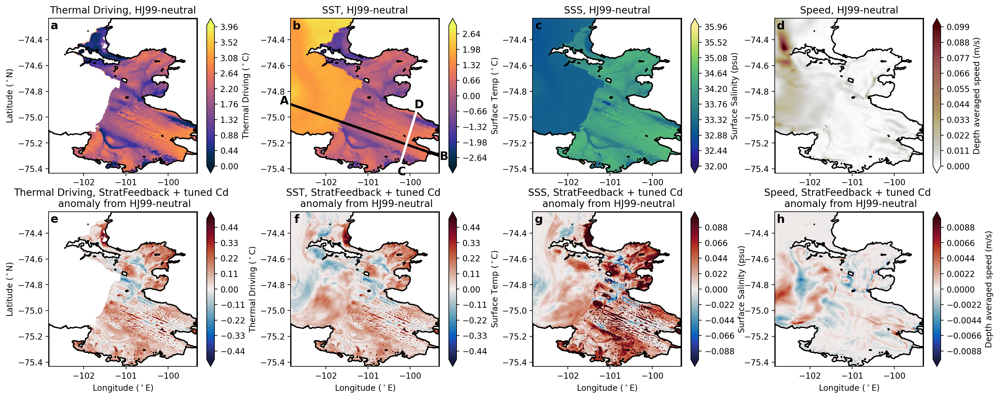

In [36]:
## supp figure

# Plot for control and tuned R22, thermal driving, surf temp, surf salinity, depth averaged KE

fig, axes  = plt.subplots(ncols = 4,nrows = 2, figsize = (20,8),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-bigCd-20Aug']
titles = ['HJ99-neutral', 'StratFeedback + tuned Cd \n anomaly from HJ99-neutral']
end = '/output000/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000


for i in np.arange(2):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    #W = mds.rdmds(dir+names[i]+end+'SHICE_fwFlux', 86400)
    Salt = mean2050days('Stave')
    Temp = mean2050days('Ttave')
    UU = mean2050days('UUtave')
    VV = mean2050days('VVtave')
    speed = np.sqrt(UU**2+VV**2)
    speed = np.nanmean(np.where(speed > 0, speed, np.nan),axis = 0)
    hFacC = mds.rdmds(dir+names[i]+end+'hFacC')
    DRC = mds.rdmds(dir+names[i]+end+'DRC')
    Depth = np.cumsum(hFacC*DRC[-1],axis = 0)
    Pressure = 9.81*1030*Depth/10000 #dbar

    thetaFreeze = Salt*-0.0575 + - 7.61e-4*Pressure+0.0901
    ThermalDriving = Temp-thetaFreeze
    ThermalDrivingmask = (Temp ==0)*10000 + np.rollaxis(np.tile(np.arange(130),(600,460,1)),2)
    
    topcells = np.argmin((ThermalDrivingmask), axis = 0)
    masktop = np.rollaxis(np.tile(np.arange(130),(600,460,1)),2) ==np.tile(topcells,(130,1,1))
    masktop = masktop*1
    ThermalDriving = (masktop*ThermalDriving).sum(axis = 0)
    ThermalDriving = ThermalDriving * (Temp[0,...] ==0)
    ThermalDriving = np.where(ThermalDriving>0,ThermalDriving,np.nan)

    Depthmasked = np.where((Temp !=0),np.rollaxis(np.tile(np.arange(130),(600,460,1)),2),1000000)
    #Depthmasked[0,:] = np.where(np.sum(Depthmasked,axis = 0)==np.nan,0,Depthmasked[0,:])
    topcells = (np.nanargmin((Depthmasked), axis = 0))
    #np.sum(topcells,axis = 0)
    sst = np.nansum(np.where(Depthmasked ==topcells,Temp,np.nan),axis = 0)
    sst = np.where(sst!=0,sst,np.nan)
    sss = np.nansum(np.where(Depthmasked ==topcells,Salt,np.nan),axis = 0)
    sss = np.where(sss!=0,sss,np.nan)
    
    T = Temp

    if i==0:
        cs = axes[i,0].contourf(XC, YC, ThermalDriving, levels = np.linspace(0,4,101),cmap= cm.cm.thermal, extend = 'both')
        control_TD = ThermalDriving
    elif i==1:
        cs = axes[i,0].contourf(XC, YC, ThermalDriving-control_TD, levels = np.linspace(-0.5,0.5,101),cmap=cm.cm.balance, extend = 'both')
        
    plt.colorbar(cs,ax = axes[i,0],label = 'Thermal Driving ($^\circ$C)', extend = 'both')
    axes[i,0].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,0].set_ylabel('Latitude ($^\circ$N)')
    axes[i,0].set_xlabel('Longitude ($^\circ$E)')
    axes[i,0].set_title('Thermal Driving, '+titles[i])
        
#    sst = (masktop*Temp).sum(axis = 0) *(Temp[0,...] ==0)
#    sss = (masktop*Salt).sum(axis = 0) *(Temp[0,...] ==0)

    if i==0:
        cs = axes[i,1].contourf(XC, YC, sst, levels = np.linspace(-3,3,101),cmap=cm.cm.thermal, extend = 'both')    
        control_sst = sst
    elif i ==1:
        cs = axes[i,1].contourf(XC, YC, sst-control_sst, levels = np.linspace(-0.5,0.5,101),cmap=cm.cm.balance, extend = 'both')    
    #axes[i,1].contourf(XC/1000, YC/1000, Temp[0,...]*(Temp[0,...] !=0), levels = np.linspace(-3,1,101),cmap='cmc.hawaii', extend = 'both',add_colorbar = False)  
    plt.colorbar(cs,ax = axes[i,1],label = 'Surface Temp ($^\circ$C)', extend = 'both')
    axes[i,1].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,1].set_ylabel('Latitude ($^\circ$N)')
    axes[i,1].set_xlabel('Longitude ($^\circ$E)')
    axes[i,1].set_title('SST, '+titles[i])

    if i==0:
        cs = axes[i,2].contourf(XC, YC, sss, levels = np.linspace(32,36,101),cmap=cm.cm.haline, extend = 'both')
        control_sss = sss
    elif i ==1:
        cs = axes[i,2].contourf(XC, YC, sss-control_sss, levels = np.linspace(-0.1,0.1,101),cmap=cm.cm.balance, extend = 'both')
        
    #axes[i,2].contourf(XC/1000, YC/1000, Salt[0,...]*(Salt[0,...] !=0), levels = np.linspace(33,36,101),cmap='cmc.imola', extend = 'both',add_colorbar = False)  
    plt.colorbar(cs,ax = axes[i,2],label = 'Surface Salinity (psu)', extend = 'both')
    axes[i,2].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,2].set_ylabel('Latitude ($^\circ$N)')
    axes[i,2].set_xlabel('Longitude ($^\circ$E)')
    axes[i,2].set_title('SSS, '+titles[i])

    if i==0:
        cs = axes[i,3].contourf(XC, YC, speed, levels = np.linspace(0,0.1,101),cmap='cmc.bilbao_r', extend = 'both')
        control_speed = speed
    elif i==1:
        cs = axes[i,3].contourf(XC, YC, speed-control_speed, levels = np.linspace(-0.01,0.01,101),cmap=cm.cm.balance, extend = 'both')
        
    plt.colorbar(cs,ax = axes[i,3],label = 'Depth averaged speed (m/s)', extend = 'both')
    axes[i,3].contour(XC, YC, np.abs(np.sum(T, axis = 0)), levels = [0], colors = 'k')
    axes[i,3].set_ylabel('Latitude ($^\circ$N)')
    axes[i,3].set_xlabel('Longitude ($^\circ$E)')
    axes[i,3].set_title('Speed, '+titles[i])
    

        
#fig.suptitle('MITgcm Pine Island Glacier, time = 20 days', fontsize = 15)
fig.subplots_adjust(top = 0.85, wspace = 0.2)

axes[0,1].set_ylabel('')
axes[0,2].set_ylabel('')
axes[0,3].set_ylabel('')
axes[1,1].set_ylabel('')
axes[1,2].set_ylabel('')
axes[1,3].set_ylabel('')

axes[0,0].set_xlabel('')
axes[0,1].set_xlabel('')
axes[0,2].set_xlabel('')
axes[0,3].set_xlabel('')


axes[0,0].text(0.04,0.95,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.95,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.95,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[0,3].text(0.04,0.95,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,3].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.95,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.95,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.95,'g',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')
axes[1,3].text(0.04,0.95,'h',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,3].transAxes, fontsize = 14,color = 'k')

#plot lines
startLat = -74.9
startLon = np.min(XC)
endLat = -75.3
endLon = np.max(XC)
axes[0,1].plot([startLon,endLon],[startLat,endLat],color = 'k',linewidth = 3)
#plot lines
startLat = np.min(YC)
startLon = -100.3
endLat = -74.9
endLon = -99.8
axes[0,1].plot([startLon,endLon],[startLat,endLat],color = 'w',linewidth = 3)

axes[0,1].text(np.min(XC)-0.25,-74.9, 'A',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-99.3,-75.33, 'B',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-100.3,-75.45, 'C',color = 'k', fontsize = 14,fontweight = 'bold')
axes[0,1].text(-99.9,-74.93, 'D',color = 'k', fontsize = 14,fontweight = 'bold')

fig.subplots_adjust(wspace = 0.3,hspace = 0.25)
plt.show()


In [37]:
import xarray as xr


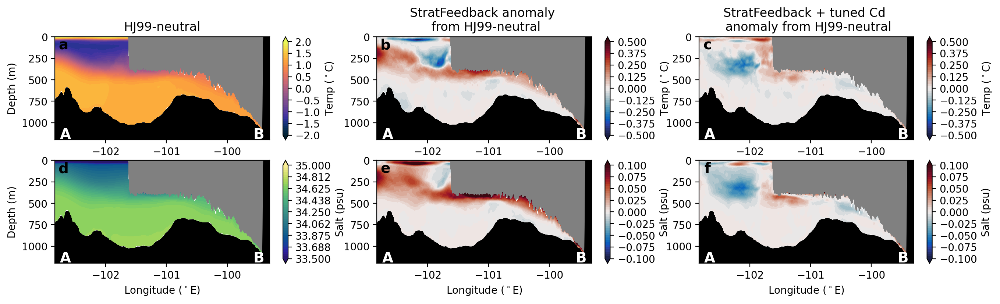

In [38]:
fig, axes  = plt.subplots(ncols = 3,nrows = 2, figsize = (16,4),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-bigCd-20Aug']
titles = ['HJ99-neutral', 'StratFeedback anomaly \n from HJ99-neutral', 'StratFeedback + tuned Cd \n anomaly from HJ99-neutral']
end = '/output004/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000
RC = mds.rdmds('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/run-R22-tes/output000/RC')

lat = 200

for i in np.arange(3):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    Ss = mean2050days('Stave')
    Ts = mean2050days('Ttave')
    maxDepth = -mds.rdmds(dir+names[i]+end+'rLowC')
    minDepth = -mds.rdmds(dir+names[i]+end+'rSurfC')
    hFacC = mds.rdmds(dir+names[i]+end+'hFacC')
    DRC = mds.rdmds(dir+names[i]+end+'DRC')
    Depth = np.cumsum(hFacC*DRC[-1],axis = 0)
    
    Ts_masked = np.where(Ts!=0,Ts,np.nan)
    Ss_masked = np.where(Ss!=0,Ss,np.nan)
    ds = xr.Dataset(
    data_vars=dict(
        temp=(["Z", "Y", "X"], Ts_masked),
        salt=(["Z", "Y", "X"], Ss_masked),
        maxD=(["Y","X"],maxDepth),
        minD=(["Y","X"],minDepth)
    ),
    attrs=dict(description="TS"),
    coords=dict(Y=("Y", YC[:,0]),
        X=("X", XC[0,:]),
        Z = ("Z",np.arange(130)*10)
        )

    )


    # Plot transect along N21 slices:
    
    startLat = -74.9
    startLon = np.min(XC)
    endLat = -75.3
    endLon = np.max(XC)
    n = 1000
    x = xr.DataArray(np.linspace(startLon,endLon,n), dims='along_course')
    y = xr.DataArray(np.linspace(startLat,endLat,n), dims='along_course')
    Temp_along = ds.temp.interp(X=x, Y=y, method='linear')
    Salt_along = ds.salt.interp(X=x, Y=y, method='linear')
    md_along = ds.maxD.interp(X=x, Y=y, method='linear')
    mid_along = ds.minD.interp(X=x, Y=y, method='linear')

    for j in np.arange(2):
        axes[j,i].fill_between(x,np.zeros(len(x)),mid_along,color = 'gray')
        axes[j,i].fill_between(x,np.ones(len(x))*1200,md_along,color = 'k')

    if i == 0:
        Temp_along_HJ99 = Temp_along
        Salt_along_HJ99 = Salt_along

        cs = axes[0,i].contourf(x,ds.Z,Temp_along, levels = np.linspace(-2,2,41), cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both')
        cs2 = axes[1,i].contourf(x,ds.Z,Salt_along, levels = np.linspace(33.5,35,41), cmap=cm.cm.haline,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both')

    else:
        cs = axes[0,i].contourf(x,ds.Z,Temp_along-Temp_along_HJ99, levels = np.linspace(-0.5,0.5,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both')
        cs2 = axes[1,i].contourf(x,ds.Z,Salt_along-Salt_along_HJ99, levels = np.linspace(-0.1,0.1,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both')
        

    if i ==0:
        axes[0,i].set_ylabel('Depth (m)')
    axes[0,i].set_xlabel('Longitude ($^\circ$E)')
    axes[0,i].set_title(titles[i])
    axes[0,i].set_ylim(1200,0)

    if i ==0:

        axes[1,i].set_ylabel('Depth (m)')
    axes[1,i].set_xlabel('Longitude ($^\circ$E)')
    #axes[1,i].set_title(titles[i])
    axes[1,i].set_ylim(1200,0)

axes[0,0].text(0.04,0.92,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'k')
axes[0,1].text(0.04,0.92,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'k')
axes[0,2].text(0.04,0.92,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'k')
axes[1,0].text(0.04,0.92,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'k')
axes[1,1].text(0.04,0.92,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'k')
axes[1,2].text(0.04,0.92,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'k')

axes2 = axes.flatten()
for i in np.arange(6):
    axes2[i].text(0.05,0.05,'A',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    axes2[i].text(0.95,0.05,'B',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')

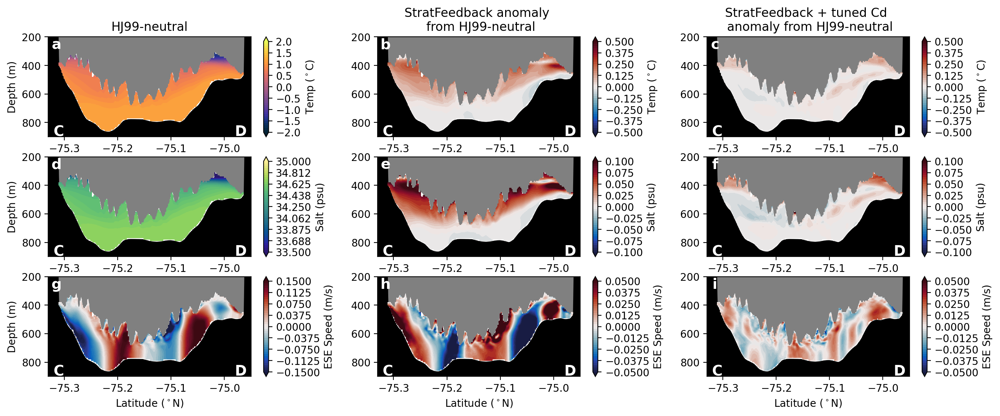

In [39]:
fig, axes  = plt.subplots(ncols = 3,nrows = 3, figsize = (16,6),dpi = 200)
dir = '/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/'
#names = ['original-run','run-R22-tes','run-R22-big_Cd004']
names = ['original-run-R22_exe','run-R22-20Aug','run-R22-bigCd-20Aug']
titles = ['HJ99-neutral', 'StratFeedback anomaly \n from HJ99-neutral', 'StratFeedback + tuned Cd \n anomaly from HJ99-neutral']
end = '/output004/'
# melt in kg/m^2/s to m/yr = multiply by #seconds per year, divide by rho_0
s_to_yr = 3600*24*365
rho0 = 1000
RC = mds.rdmds('/scratch/x77/cy8964/gadi_short/cy8964/mitgcm/archive/run-R22-tes/output000/RC')

lat = 200

for i in np.arange(3):
    XC = mds.rdmds(dir+names[i]+end+'XC')
    YC = mds.rdmds(dir+names[i]+end+'YC')
    Ts = mean2050days('Ttave')#mds.rdmds(dir+names[i]+end+'Ttave', 216000)
    Ss = mean2050days('Stave')#mds.rdmds(dir+names[i]+end+'Stave', 216000)
    hFacC = mds.rdmds(dir+names[i]+end+'hFacC')
    DRC = mds.rdmds(dir+names[i]+end+'DRC')
    Depth = np.cumsum(hFacC*DRC[-1],axis = 0)
    maxDepth = -mds.rdmds(dir+names[i]+end+'rLowC')
    minDepth = -mds.rdmds(dir+names[i]+end+'rSurfC')
    
    Ts_masked = np.where(Ts!=0,Ts,np.nan)
    Ss_masked = np.where(Ss!=0,Ss,np.nan)

    UU = mean2050days('uVeltave')#mds.rdmds(dir+names[i]+end+'UUtave', 216000)
    VV = mean2050days('vVeltave')#mds.rdmds(dir+names[i]+end+'VVtave', 216000)
    dx =  mds.rdmds(dir+names[i]+end+'DXC')
    dy = mds.rdmds(dir+names[i]+end+'DYC')
    speed_SE = (UU*dx - VV*dy)/np.sqrt(dx**2+dy**2)
    #speed_SSE = (- VV*dy + speed_SE*np.sqrt(dx**2+dy**2))/np.sqrt(dx**2+2*dy**2)
    speed_ESE = (UU*dx + speed_SE*np.sqrt(dx**2+dy**2))/np.sqrt(2*dx**2+dy**2)
    
    #speed = np.sqrt(UU**2+VV**2)
    speed_across = speed_ESE
    speed_masked = np.where(speed_across!=0,speed_across,np.nan)

    
    ds = xr.Dataset(
    data_vars=dict(
        temp=(["Z", "Y", "X"], Ts_masked),
        salt=(["Z", "Y", "X"], Ss_masked),
        speed=(["Z", "Y", "X"], speed_masked),
        maxD=(["Y","X"],maxDepth),
        minD=(["Y","X"],minDepth)
    ),
    attrs=dict(description="TS"),
    coords=dict(Y=("Y", YC[:,0]),
        X=("X", XC[0,:]),
        Z = ("Z",np.arange(130)*10)
        )

    )


    # Plot transect along N21 slices:
    
    startLat = np.min(YC)
    startLon = -100.3
    endLat = -74.9
    endLon = -99.8
    n = 1000
    x = xr.DataArray(np.linspace(startLon,endLon,n), dims='along_course')
    y = xr.DataArray(np.linspace(startLat,endLat,n), dims='along_course')
    Temp_along = ds.temp.interp(X=x, Y=y, method='linear')
    Salt_along = ds.salt.interp(X=x, Y=y, method='linear')
    speed_along = ds.speed.interp(X=x, Y=y, method='linear')
    md_along = ds.maxD.interp(X=x, Y=y, method='linear')
    mid_along = ds.minD.interp(X=x, Y=y, method='linear')

    for j in np.arange(3):
        axes[j,i].fill_between(y,np.zeros(len(y)),mid_along,color = 'gray')
        axes[j,i].fill_between(y,np.ones(len(y))*1200,md_along,color = 'k')

    if i ==0:
        cs = axes[0,i].contourf(y,ds.Z,Temp_along, levels = np.linspace(-2,2,41), cmap=cm.cm.thermal,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both')
        axes[0,i].set_ylabel('Depth (m)')
        Temp_along_HJ99 = Temp_along
    else:
        cs = axes[0,i].contourf(y,ds.Z,Temp_along-Temp_along_HJ99, levels = np.linspace(-0.5,0.5,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs,ax = axes[0,i],label = 'Temp ($^\circ$C)', extend = 'both')
        
    axes[0,i].set_xlabel('Latitude ($^\circ$N)')
    axes[0,i].set_title(titles[i])
    axes[0,i].set_ylim(600,0)

    if i ==0:
        cs2 = axes[1,i].contourf(y,ds.Z,Salt_along, levels = np.linspace(33.5,35,41), cmap=cm.cm.haline,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both')
        Salt_along_HJ99 = Salt_along
        axes[1,i].set_ylabel('Depth (m)')
    else:
        cs2 = axes[1,i].contourf(y,ds.Z,Salt_along-Salt_along_HJ99, levels = np.linspace(-0.1,0.1,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[1,i],label = 'Salt (psu)', extend = 'both')
        
    axes[1,i].set_xlabel('Latitude ($^\circ$N)')
    #axes[1,i].set_title(titles[i])

    if i ==0:
        cs2 = axes[2,i].contourf(y,ds.Z,speed_along, levels = np.linspace(-0.15,0.15,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[2,i],label = 'ESE Speed (m/s)', extend = 'both')
        speed_along_HJ99 = speed_along
        axes[2,i].set_ylabel('Depth (m)')
    else:
        cs2 = axes[2,i].contourf(y,ds.Z,speed_along-speed_along_HJ99, levels = np.linspace(-0.05,0.05,41), cmap=cm.cm.balance,extend = 'both')
        plt.colorbar(cs2,ax = axes[2,i],label = 'ESE Speed (m/s)', extend = 'both')
        
    axes[2,i].set_xlabel('Latitude ($^\circ$N)')

    
    axes[1,i].set_ylim(900,200)
    axes[0,i].set_ylim(900,200)
    axes[2,i].set_ylim(900,200)

    axes[0,i].set_xlim(-75.33,-74.95)
    axes[1,i].set_xlim(-75.33,-74.95)
    axes[2,i].set_xlim(-75.33,-74.95)
    
axes[0,0].text(0.04,0.92,'a',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,0].transAxes, fontsize = 14,color = 'w')
axes[0,1].text(0.04,0.92,'b',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,1].transAxes, fontsize = 14,color = 'w')
axes[0,2].text(0.04,0.92,'c',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[0,2].transAxes, fontsize = 14,color = 'w')
axes[1,0].text(0.04,0.92,'d',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,0].transAxes, fontsize = 14,color = 'w')
axes[1,1].text(0.04,0.92,'e',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,1].transAxes, fontsize = 14,color = 'w')
axes[1,2].text(0.04,0.92,'f',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[1,2].transAxes, fontsize = 14,color = 'w')
axes[2,0].text(0.04,0.92,'g',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,0].transAxes, fontsize = 14,color = 'w')
axes[2,1].text(0.04,0.92,'h',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,1].transAxes, fontsize = 14,color = 'w')
axes[2,2].text(0.04,0.92,'i',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes[2,2].transAxes, fontsize = 14,color = 'w')

axes2 = axes.flatten()
for i in np.arange(9):
    axes2[i].text(0.05,0.05,'C',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    axes2[i].text(0.95,0.05,'D',horizontalalignment='center', fontweight='bold',
     verticalalignment='center',transform=axes2[i].transAxes, fontsize = 14,color = 'w')
    
fig.subplots_adjust(wspace = 0.3)
